In [1]:
import numpy as np
import scanpy as sc
import scvelo as scv
import sys
import torch
import matplotlib.pyplot as plt
import umap
import os.path
sys.path.append('../')
import velovae as vv
from datetime import datetime

In [2]:
torch.cuda.is_available()

True

In [3]:
now = datetime.now()
date = now.strftime("%m_%d_%Y")

In [4]:
adata = sc.read_h5ad('../../RNA_ATAC/macrophage/3423-MV-2-8489-MV-1_adata_postpro_concat.h5ad')
adata_atac = sc.read_h5ad('../../RNA_ATAC/macrophage/3423-MV-2-8489-MV-1_adata_atac_postpro_concat.h5ad')

In [5]:
gene_plot = ['AZU1', 'HBD', 'HDC', 'LYZ', 'PF4', 'SPINK2']
np.isin(gene_plot, adata.var_names)

array([ True,  True,  True,  True,  True,  True])

In [6]:
'PROM1' in adata.var_names

True

In [7]:
dataset = "3423-MV-2-8489-MV-1"
model_path_base = f"checkpoints/{dataset}"
figure_path_base = f"figures/{dataset}"
data_path_base = f"data/{dataset}"

In [8]:
adata, adata_atac

(AnnData object with n_obs × n_vars = 17667 × 892
     obs: 'total_unspliced', 'total_spliced', 'log1p_total_unspliced', 'log1p_total_spliced', 'fraction_u', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'log1p_total_counts_rb', 'pct_counts_rb', 'total_counts_hla', 'log1p_total_counts_hla', 'pct_counts_hla', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'S_score', 'G2M_score', 'phase', 'CC_difference', 'total_unspliced2', 'total_spliced2', 'log1p_total_unspliced2', 'log1p_total_spliced2', 'fraction_u2', 'n_c', 'n_Mu', 'n_Ms', 'leiden', 'total_chromatin', 'total_unspliced3', 'total_spliced3', 'log1p_total_unspliced3', 'log1p_total_spliced3', 'fraction_u3', 'total_Mc', 'total_Mu', 'total_Ms', 'batch', 'n_Mc'
     var: 'gene_ids', 'feature

In [9]:
adata.obs['leiden'].cat.categories

Index(['CMP', 'DC', 'Erythrocyte', 'GMP', 'Granulocyte', 'HSC', 'LMPP', 'MEP',
       'Mast Cells', 'Megakaryocyte', 'Platelet', 'Prog DC', 'Prog MK'],
      dtype='object')

In [10]:
adata.obs['batch'].cat.categories

Index(['Sample 1', 'Sample 2'], dtype='object')

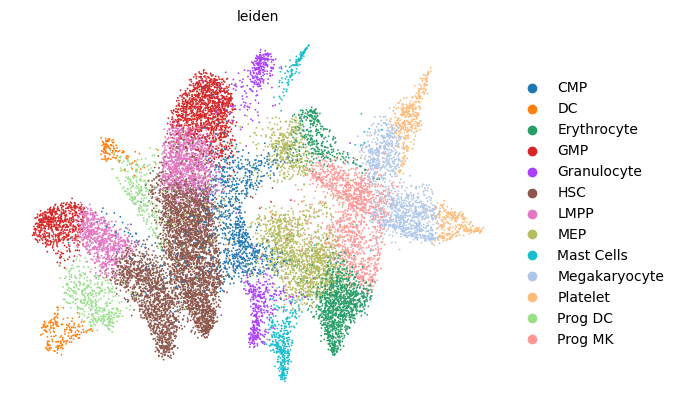

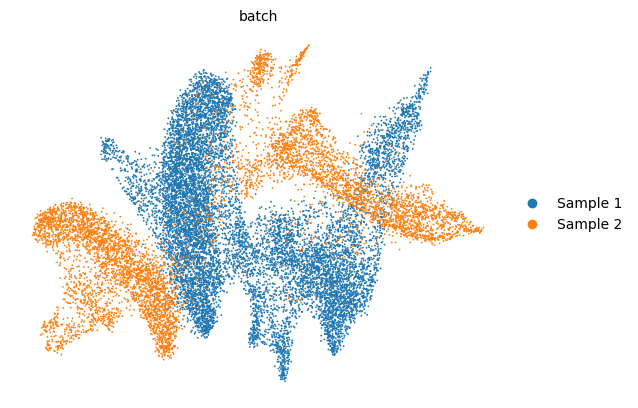

In [11]:
os.makedirs(figure_path_base, exist_ok=True)
scv.pl.scatter(adata, basis='umap', color='leiden', legend_loc='right margin')
scv.pl.scatter(adata, basis='umap', color='batch', legend_loc='right margin')

In [12]:
figure_path = figure_path_base+'/'+date
model_path = model_path_base+'/'+date
data_path = data_path_base

In [13]:
torch.manual_seed(2022)
np.random.seed(2022)
model = vv.VAEChrom(adata,
                    adata_atac,
                    batch_key='batch',
                    ref_batch=1,
                    batch_hvg_key='highly_variable',
                    var_to_regress=['total_unspliced3'],
                    device='cuda:0',
                    plot_init=False,
                    gene_plot=gene_plot,
                    cluster_key="leiden",
                    figure_path=figure_path,
                    embed="umap")

model.train(plot=False,
            gene_plot=gene_plot,
            figure_path=figure_path,
            embed="umap")

model.save_model(model_path)
model.save_anndata(data_path, file_name="out.h5ad")

CVAE enabled. Performing batch effect correction.
Reference batch set to 1 (Sample 2).
Latent dimension set to 8.
KL weights set to 2.00 2.00.
Found ['total_unspliced3'] in obs. Regressing them out.
Batch 0 sparsity: 0.118
Batch 1 sparsity: 0.139
Learning rate set to 7.4e-4 based on data sparsity.
Early stop threshold set to 1.5.
Using Gaussian Prior.
Initializing using the steady-state and dynamical models.


  0%|          | 0/892 [00:00<?, ?it/s]

859 out of 892 = 96.3% genes have good ellipse fits.
KS-test result: [1. 1. 1. 1. 1. 1. 1.]
Assigning cluster 6 to repressive.
Initial induction: 690, repression: 202 out of 892.
Computing scaling factors for each batch class.
--------------------------- Train a VeloVAE ---------------------------
*********      Creating Training and Validation Datasets      *********
Total Number of Iterations Per Epoch: 49, test iteration: 96
*********                      Finished.                      *********
*********                      Stage  1                       *********
Epoch 1: Train ELBO = 122.456, Test ELBO = -58430.989		Total Time =   0 h :  0 m :  1 s
Epoch 50: Train ELBO = 1501.256, Test ELBO = 1497.321		Total Time =   0 h :  0 m : 20 s
*********     Stage 1: Early Stop Triggered at epoch 83.     *********
*********     Retrieving best model from iteration 3745.      *********
*********                      Stage  2                       *********
Cell-wise KNN estimation.
Using 6

  0%|          | 0/17667 [00:00<?, ?it/s]

Percentage of Invalid Sets: 0.000
Average Set Size: 80
Finished. Actual Time:   0 h :  0 m : 17 s
*********             Velocity Refinement Round 1             *********
Epoch 92: Train ELBO = 1502.394, Test ELBO = 1498.219		Total Time =   0 h :  0 m : 54 s
*********     Round 1: Early Stop Triggered at epoch 92.     *********
*********     Retrieving best model from iteration 4450.      *********
Cell-wise KNN estimation.
Finished. Actual Time:   0 h :  0 m :  2 s
*********             Velocity Refinement Round 2             *********
Epoch 96: Train ELBO = 1479.619, Test ELBO = 1475.280		Total Time =   0 h :  0 m : 58 s
*********     Round 2: Early Stop Triggered at epoch 96.     *********
*********     Retrieving best model from iteration 4642.      *********
Change in x0: 0.181
Cell-wise KNN estimation.
Finished. Actual Time:   0 h :  0 m :  2 s
*********             Velocity Refinement Round 3             *********
Epoch 100: Train ELBO = 1454.875, Test ELBO = 1451.734		Total Time

In [14]:
key = "vae"
basis = "umap"

In [15]:
z = adata.obsm[f'{key}_z']
t = adata.obs[f'{key}_time'].to_numpy()
rho = adata.layers[f'{key}_rho']
kc = adata.layers[f'{key}_kc']

In [16]:
umap_obj = umap.UMAP(n_neighbors=30, n_components=2, min_dist=0.25, random_state=2022)
z_umap = umap_obj.fit_transform(z)

z_batch = adata.obsm[f'{key}_z_batch']
umap_obj = umap.UMAP(n_neighbors=30, n_components=2, min_dist=0.25, random_state=2022)
z_umap2 = umap_obj.fit_transform(z_batch)

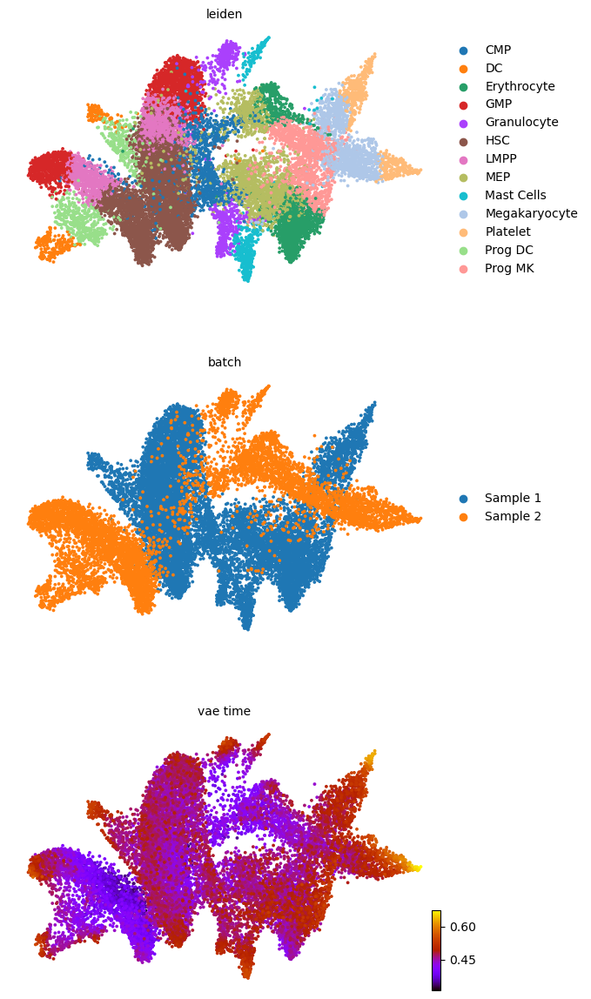

saving figure to file figures/3423-MV-2-8489-MV-1/11_11_2024/3423-MV-2-8489-MV-1_z_batch_time_vae.png


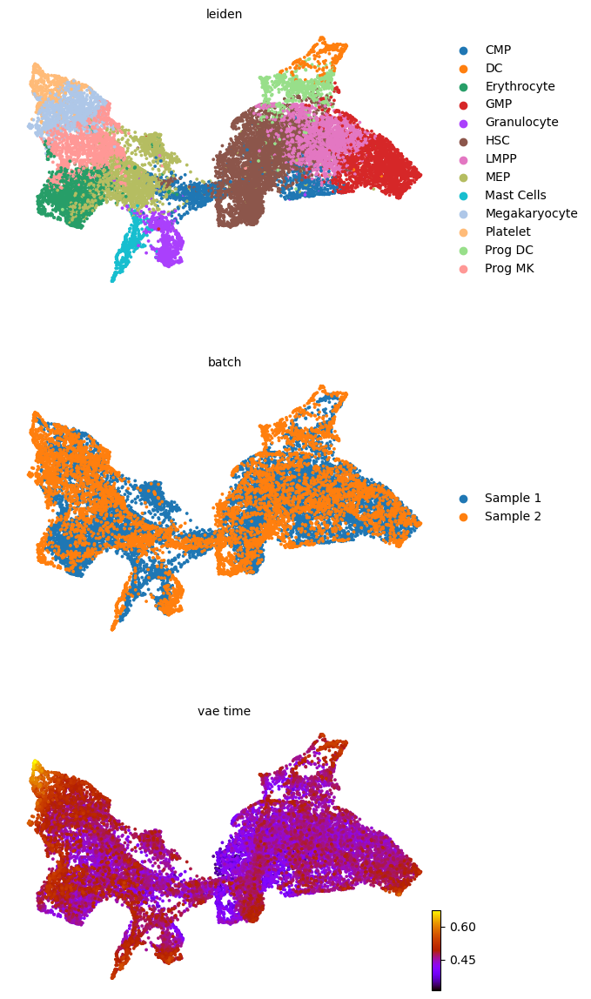

saving figure to file figures/3423-MV-2-8489-MV-1/11_11_2024/3423-MV-2-8489-MV-1_z_batch_time2_vae.png


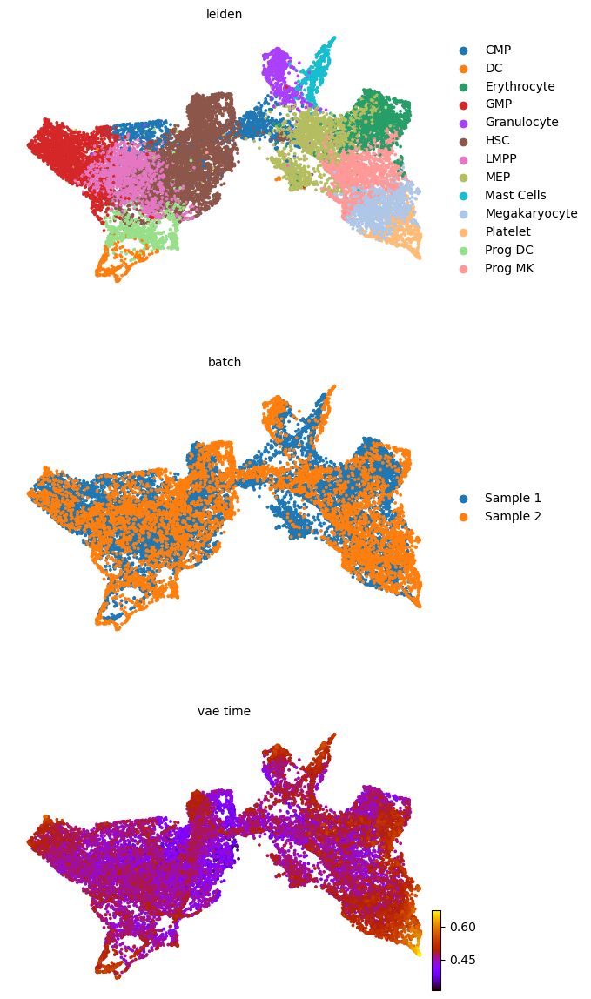

In [17]:
scv.pl.scatter(adata, basis='umap', color=['leiden', 'batch', f'{key}_time'], legend_loc='right', color_map='gnuplot', ncols=1, size=30)
adata.obsm['X_z_umap'] = z_umap
scv.pl.scatter(adata, basis='z_umap', color=['leiden', 'batch', f'{key}_time'], legend_loc='right', color_map='gnuplot', ncols=1, size=30, save=f'{figure_path}/{dataset}_z_batch_time_{key}.png')
adata.obsm['X_z_umap2'] = z_umap2
scv.pl.scatter(adata, basis='z_umap2', color=['leiden', 'batch', f'{key}_time'], legend_loc='right', color_map='gnuplot', ncols=1, size=30, save=f'{figure_path}/{dataset}_z_batch_time2_{key}.png')

In [18]:
adata.obsm[f'{key}_latent'] = np.concatenate((adata.obsm[f'{key}_z'], adata.obsm[f'{key}_t']), axis=1)
sc.pp.neighbors(adata, use_rep=f'{key}_latent', n_neighbors=50)

computing velocity graph (using 1/8 cores)


  0%|          | 0/17667 [00:00<?, ?cells/s]

    finished (0:00:55) --> added 
    'vae_velocity_norm_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'vae_velocity_norm_z_umap', embedded velocity vectors (adata.obsm)


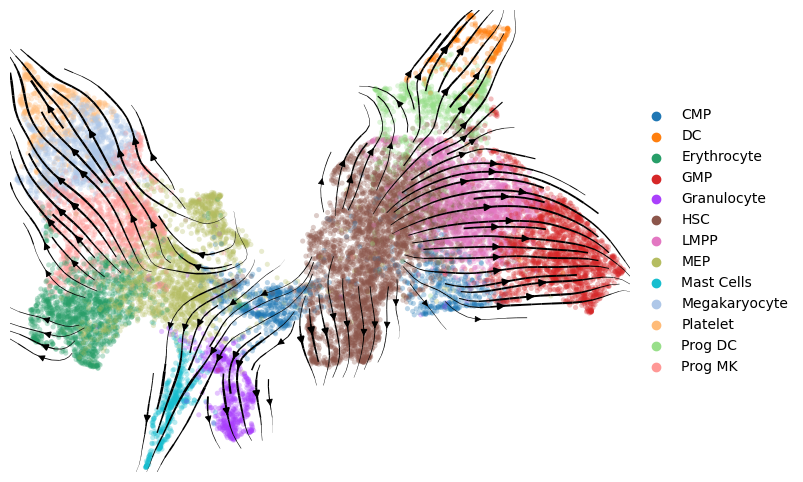

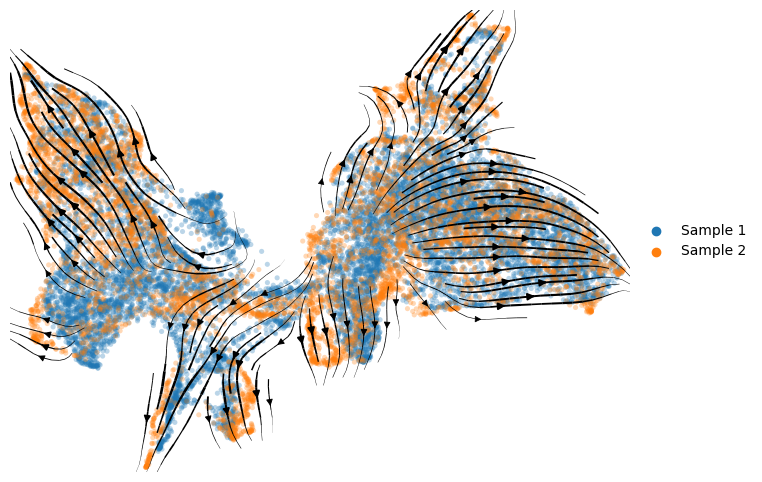

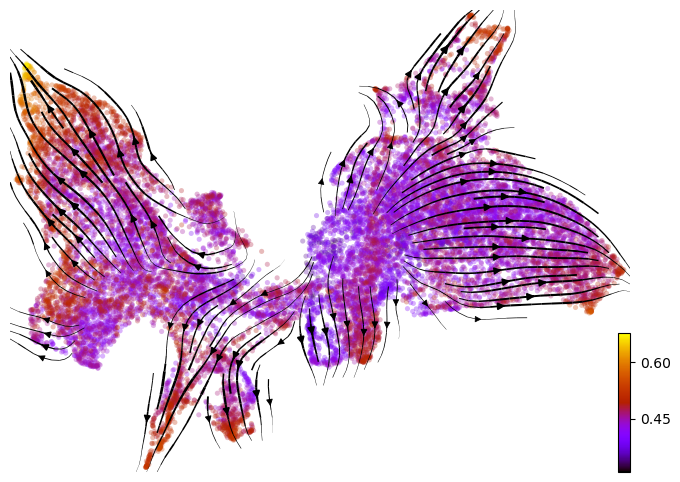

In [19]:
adata.obsm['X_z_umap'] = z_umap
vv.model.velocity_graph(adata, key=key, batch_corrected=True)
vv.velocity_embedding_stream(adata, key=key, basis='z_umap', color='leiden', title="", figsize=(8,6), legend_loc='right margin')
vv.velocity_embedding_stream(adata, key=key, basis='z_umap', color='batch', title="", figsize=(8,6), legend_loc='right margin')
vv.velocity_embedding_stream(adata, key=key, basis='z_umap', color=f'{key}_time', color_map='gnuplot', title="", figsize=(8,6), legend_loc='right margin')

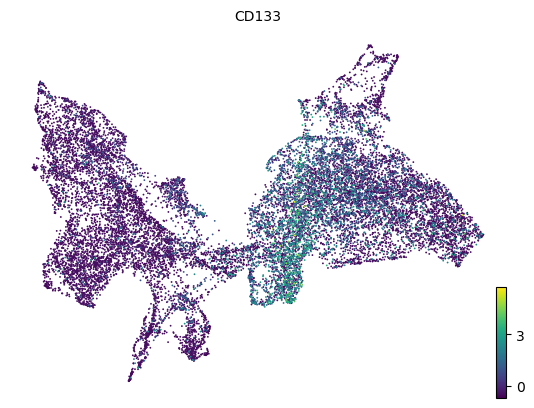

In [20]:
scv.pl.scatter(adata, color='PROM1', basis='z_umap', title='CD133')

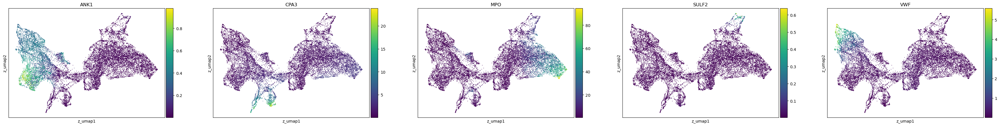

In [21]:
sc.pl.scatter(adata, basis='z_umap', layers=f'{key}_shat', color=['ANK1', 'CPA3', 'MPO', 'SULF2', 'VWF'])

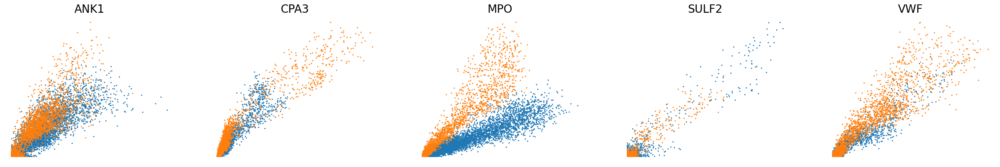

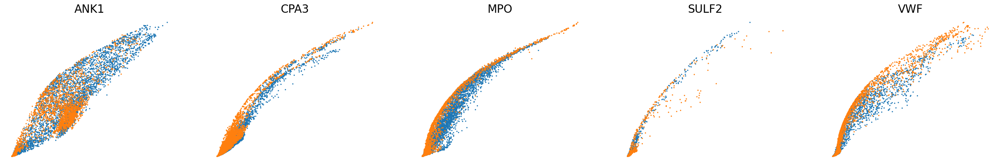

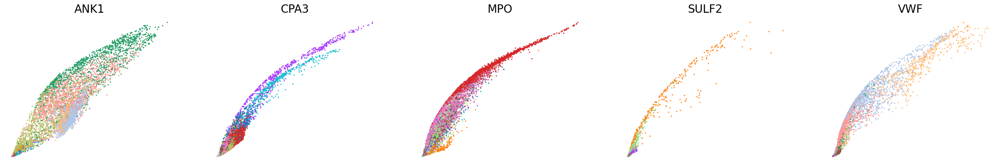

In [22]:
scv.pl.scatter(adata, basis=['ANK1', 'CPA3', 'MPO', 'SULF2', 'VWF'], color='batch', ncols=5, frameon=False, size=20, fontsize=20)
scv.pl.scatter(adata, basis=['ANK1', 'CPA3', 'MPO', 'SULF2', 'VWF'], x=f'{key}_shat', y=f'{key}_uhat', color='batch', ncols=5, frameon=False, size=20, fontsize=20)
scv.pl.scatter(adata, basis=['ANK1', 'CPA3', 'MPO', 'SULF2', 'VWF'], x=f'{key}_shat', y=f'{key}_uhat', color='leiden', ncols=5, frameon=False, size=20, fontsize=20)

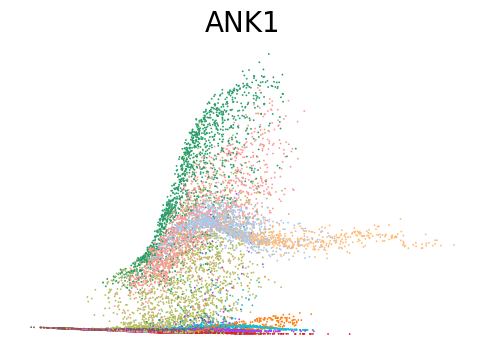

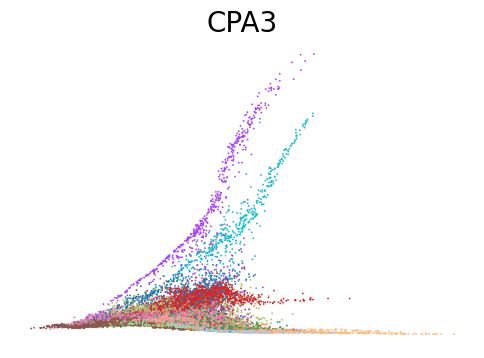

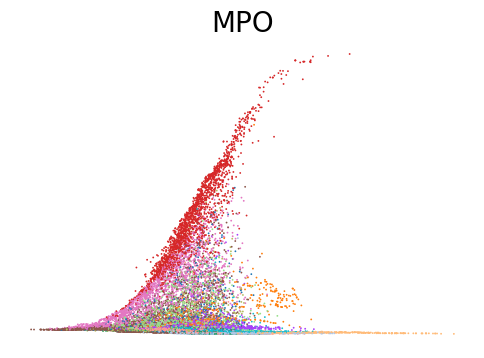

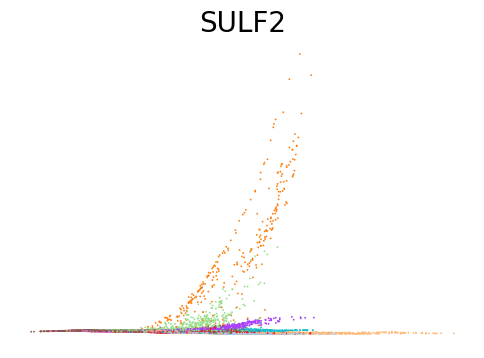

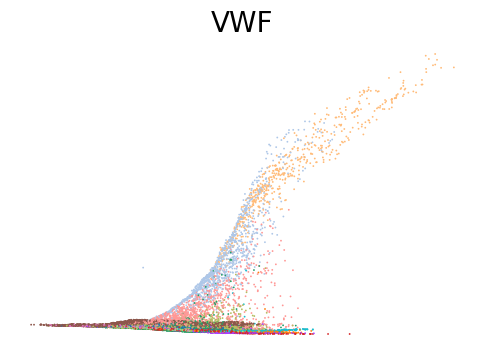

In [23]:
for gene in ['ANK1', 'CPA3', 'MPO', 'SULF2', 'VWF']:
    scv.pl.scatter(adata, x=adata.obs[f'{key}_time'], y=adata[:, gene].layers[f'{key}_shat'], color='leiden', figsize=(6,4), title=f'{gene}', legend_loc='none', frameon=False, fontsize=20)

In [24]:
top_genes = adata[:, adata.var[f'{key}_velocity_genes']].var[f'{key}_likelihood'].sort_values(ascending=False).index
top_genes = top_genes[~np.isin(top_genes, ['ANK1', 'CPA3', 'MPO', 'SULF2', 'VWF'])]

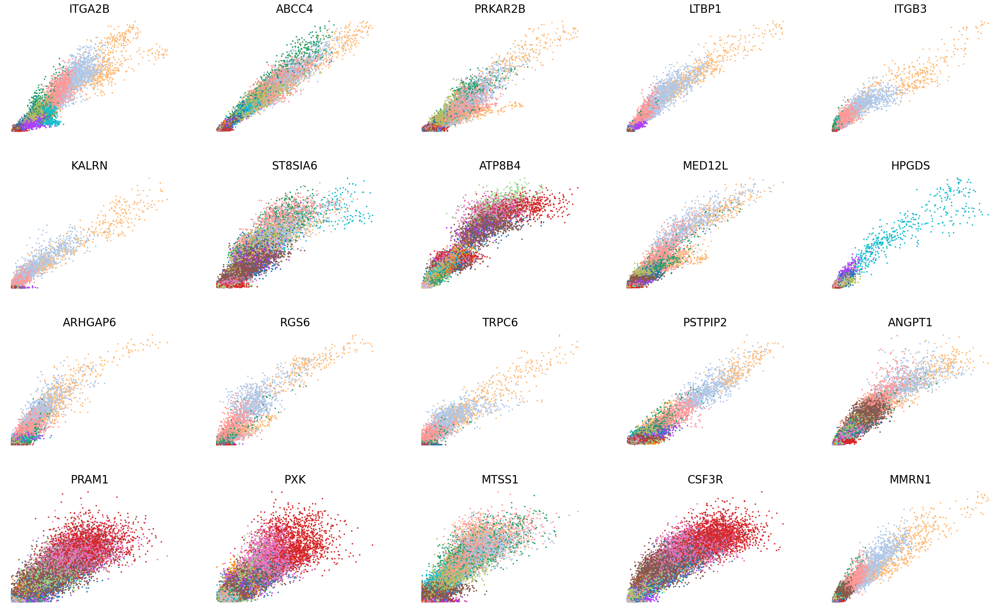

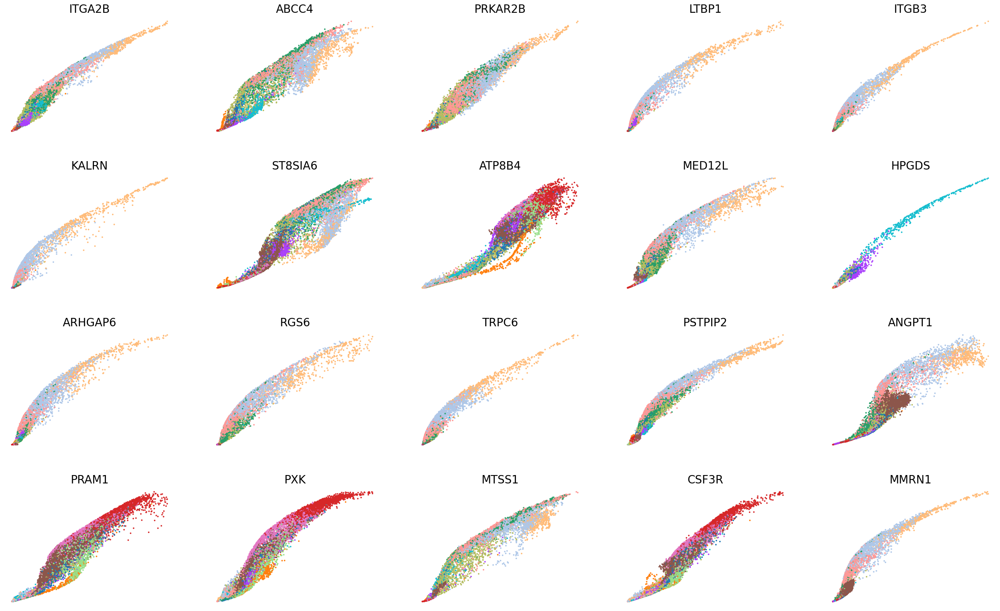

In [25]:
scv.pl.scatter(adata, basis=top_genes[:20], color='leiden', ncols=5, frameon=False, fontsize=20, size=30)
scv.pl.scatter(adata, basis=top_genes[:20], x=f'{key}_shat', y=f'{key}_uhat', color='leiden', ncols=5, frameon=False, fontsize=20, size=30)

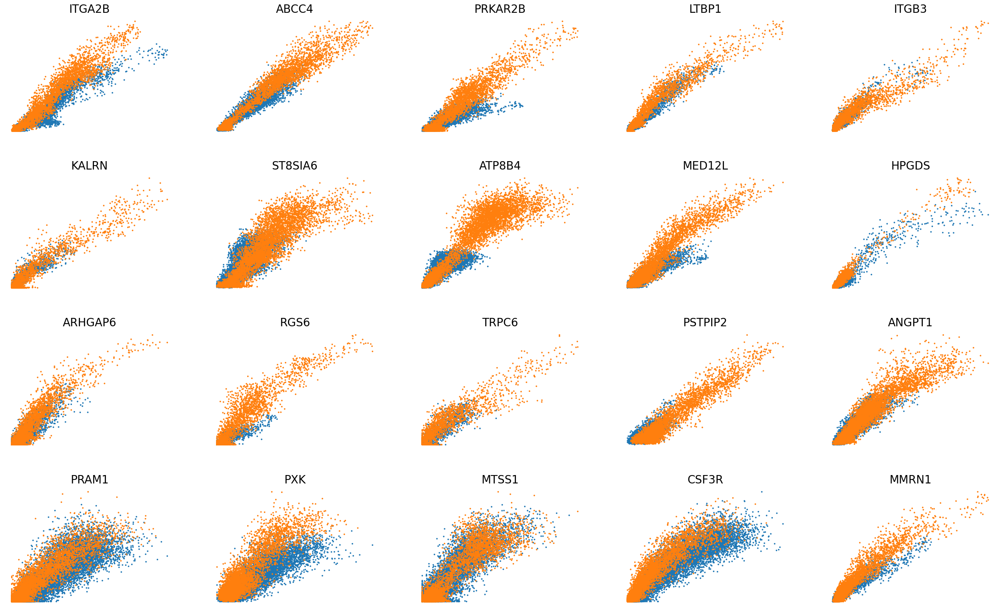

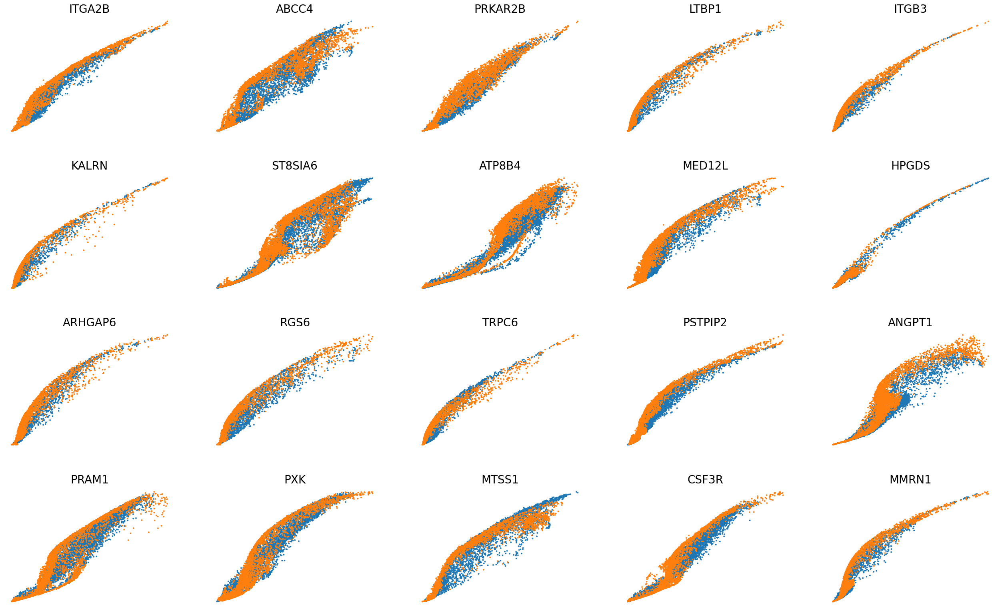

In [26]:
scv.pl.scatter(adata, basis=top_genes[:20], color='batch', ncols=5, frameon=False, fontsize=20, size=30)
scv.pl.scatter(adata, basis=top_genes[:20], x=f'{key}_shat', y=f'{key}_uhat', color='batch', ncols=5, frameon=False, fontsize=20, size=30)

In [27]:
adata.layers['Mc'] = adata_atac.layers['Mc'].copy()

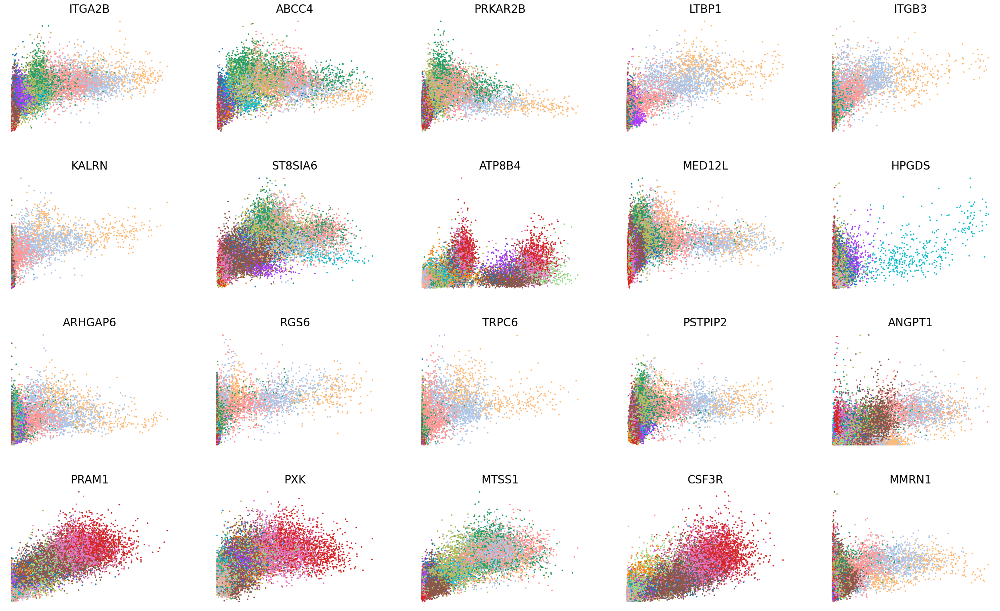

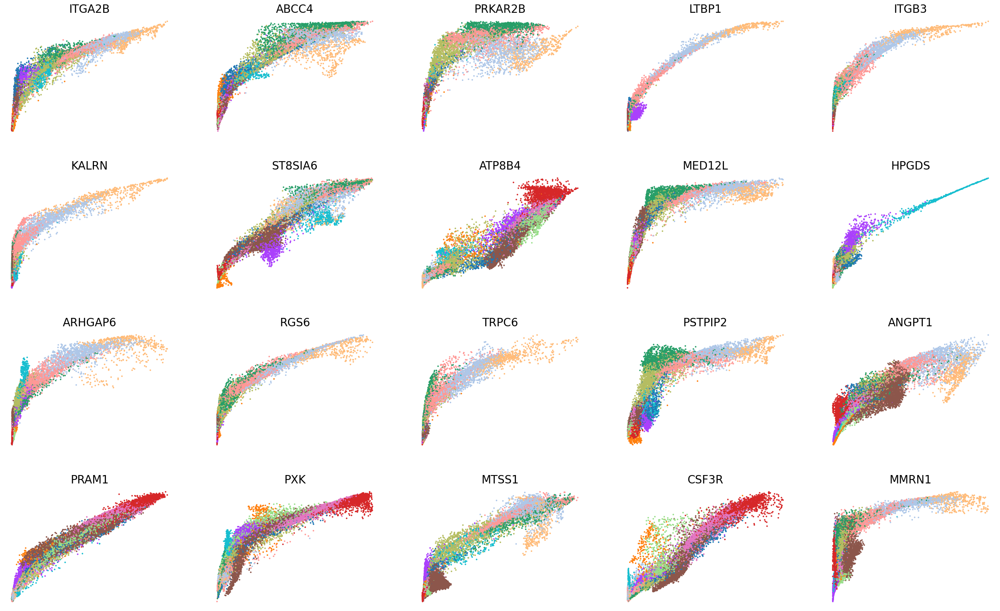

In [28]:
scv.pl.scatter(adata, basis=top_genes[:20], x='Mu', y='Mc', color='leiden', ncols=5, frameon=False, fontsize=20, size=30)
scv.pl.scatter(adata, basis=top_genes[:20], x=f'{key}_uhat', y=f'{key}_chat', color='leiden', ncols=5, frameon=False, fontsize=20, size=30)

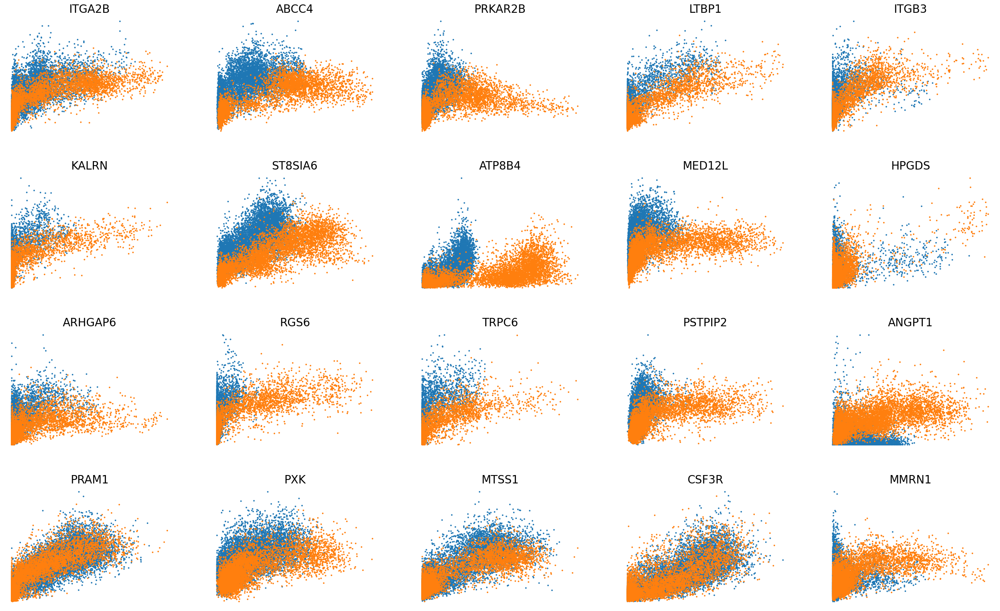

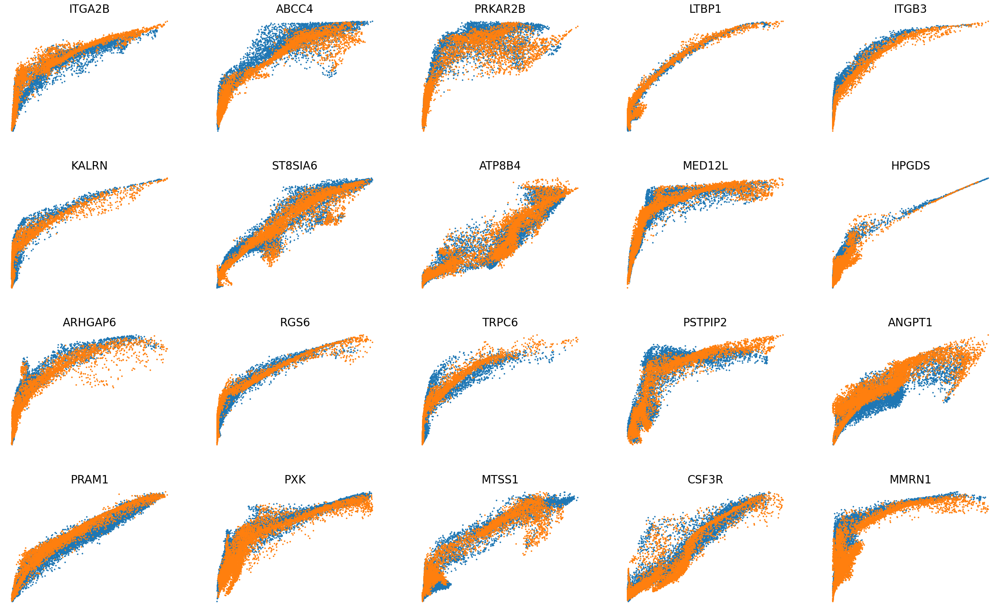

In [29]:
scv.pl.scatter(adata, basis=top_genes[:20], x='Mu', y='Mc', color='batch', ncols=5, frameon=False, fontsize=20, size=30)
scv.pl.scatter(adata, basis=top_genes[:20], x=f'{key}_uhat', y=f'{key}_chat', color='batch', ncols=5, frameon=False, fontsize=20, size=30)

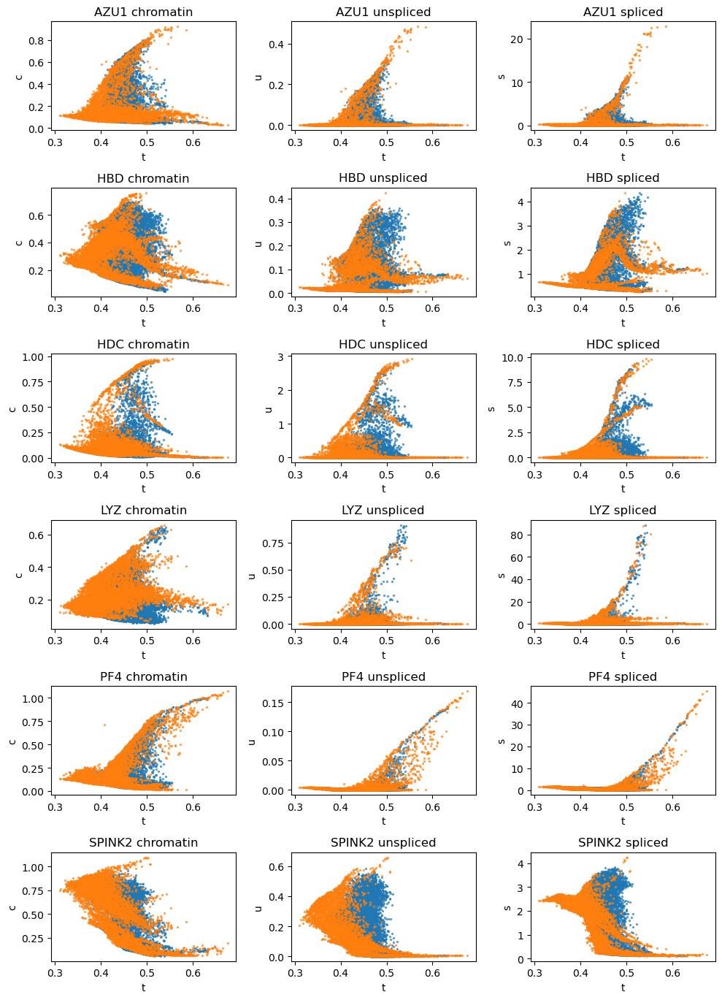

In [30]:
vv.dynamic_plot(adata, adata_atac, gene_plot, color_by='batch', batch_correction=True)

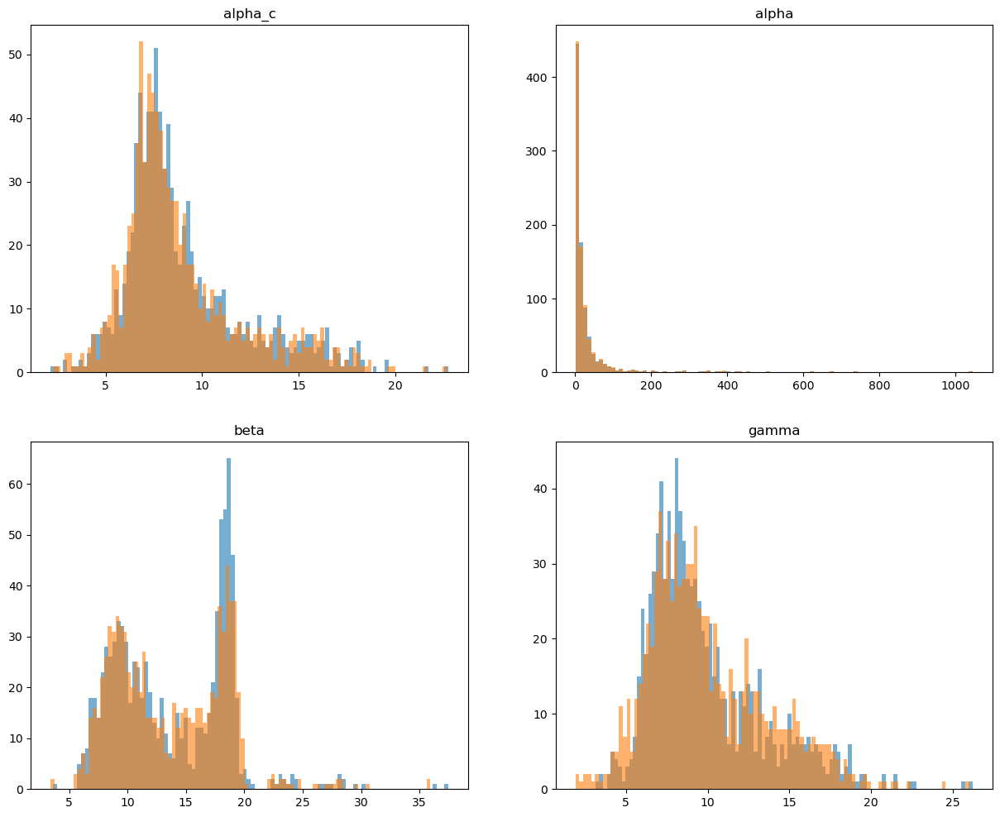

In [31]:
fig, axs = plt.subplots(2, 2, figsize=(15, 12))
axs[0, 0].hist(adata.var[f'{key}_alpha_c_0'], bins=100, alpha=0.6);
axs[0, 0].hist(adata.var[f'{key}_alpha_c_1'], bins=100, alpha=0.6);
axs[0, 0].set_title('alpha_c');
a1 = adata.var[f'{key}_alpha_0'].values
a1 = a1[a1 < np.percentile(a1, 99.5)]
a2 = adata.var[f'{key}_alpha_1'].values
a2 = a2[a2 < np.percentile(a2, 99.5)]
axs[0, 1].hist(a1, bins=100, alpha=0.6);
axs[0, 1].hist(a2, bins=100, alpha=0.6);
axs[0, 1].set_title('alpha');
axs[1, 0].hist(adata.var[f'{key}_beta_0'], bins=100, alpha=0.6);
axs[1, 0].hist(adata.var[f'{key}_beta_1'], bins=100, alpha=0.6);
axs[1, 0].set_title('beta');
axs[1, 1].hist(adata.var[f'{key}_gamma_0'], bins=100, alpha=0.6);
axs[1, 1].hist(adata.var[f'{key}_gamma_1'], bins=100, alpha=0.6);
axs[1, 1].set_title('gamma');

In [32]:
adata.write_h5ad(data_path_base+"/final.h5ad")